In [1]:
%cd /Users/denis/Documents/Projects/jupyter-notebook/notebook-generator/gtex/data

/Users/denis/Documents/Projects/jupyter-notebook/notebook-generator/gtex/data


In [2]:
import pandas as pd
import scipy.stats as ss
import numpy as np
from IPython.display import display, Markdown
%load_ext rpy2.ipython
%R require(pheatmap);
%R require(RColorBrewer);

/Users/denis/anaconda3/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/Users/denis/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:145: RRuntimeWarning: Loading required package: pheatmap

  warnings.warn(x, RRuntimeWarning)
/Users/denis/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:145: RRuntimeWarning: Loading required package: RColorBrewer

  warnings.warn(x, RRuntimeWarning)


## 1. Load Data

In [88]:
tpm = pd.read_feather('rawdata/GTEx_Analysis_2016-01-15_v7_RNASeQCv1.1.8_gene_tpm.feather').set_index('Description').drop('Name', axis=1)
tpm.head()

/Users/denis/anaconda3/lib/python3.6/site-packages/pandas/io/feather_format.py:112: FutureWarning: `nthreads` argument is deprecated, pass `use_threads` instead
  return feather.read_dataframe(path, nthreads=nthreads)


,GTEX-1117F-0226-SM-5GZZ7,GTEX-111CU-1826-SM-5GZYN,GTEX-111FC-0226-SM-5N9B8,GTEX-111VG-2326-SM-5N9BK,GTEX-111YS-2426-SM-5GZZQ,GTEX-1122O-2026-SM-5NQ91,GTEX-1128S-2126-SM-5H12U,GTEX-113IC-0226-SM-5HL5C,GTEX-117YX-2226-SM-5EGJJ,GTEX-11DXW-0326-SM-5H11W,...,GTEX-ZVE2-0006-SM-51MRW,GTEX-ZVP2-0005-SM-51MRK,GTEX-ZVT2-0005-SM-57WBW,GTEX-ZVT3-0006-SM-51MT9,GTEX-ZVT4-0006-SM-57WB8,GTEX-ZVTK-0006-SM-57WBK,GTEX-ZVZP-0006-SM-51MSW,GTEX-ZVZQ-0006-SM-51MR8,GTEX-ZXES-0005-SM-57WCB,GTEX-ZXG5-0005-SM-57WCN
Description,,,,,,,,,,,,,,,,,,,,,
DDX11L1,0.10820,0.11580,0.02104,0.02329,0.00000,0.04641,0.03076,0.09358,0.12100,0.02859,...,0.09012,0.14620,0.10450,0.00000,0.6603,0.69500,0.12130,0.41690,0.23550,0.14500
WASH7P,21.40000,11.03000,16.75000,8.17200,7.65800,9.37200,10.08000,13.56000,9.88900,9.12100,...,3.92600,13.13000,5.53700,5.78900,8.4390,7.84300,12.39000,12.53000,8.02700,12.76000
MIR1302-11,0.16020,0.06433,0.04674,0.00000,0.05864,0.00000,0.13670,0.20790,0.05375,0.06351,...,0.08008,0.03607,0.00000,0.10590,0.0000,0.06432,0.05388,0.00000,0.04756,0.05367
FAM138A,0.05045,0.00000,0.02945,0.03260,0.00000,0.00000,0.08610,0.13100,0.06773,0.00000,...,0.00000,0.06818,0.07309,0.03336,0.0000,0.08105,0.00000,0.05304,0.02996,0.03381
OR4G4P,0.00000,0.00000,0.00000,0.00000,0.00000,0.00000,0.11080,0.05619,0.00000,0.00000,...,0.00000,0.00000,0.00000,0.00000,0.0000,0.00000,0.08739,0.00000,0.00000,0.04353


In [89]:
# data = pd.read_feather('./rawdata/GTEx_Analysis_2016-01-15_v7_RNASeQCv1.1.8_gene_reads.feather')

# data = data.set_index('Description').drop('Name', axis=1)
# data.head()

## 2. Load Metadata

In [90]:
# Samples
samples = pd.read_table('rawdata/GTEx_v7_Annotations_SampleAttributesDS.txt')
samples['SUBJID'] = ['-'.join(x.split('-')[:2]) for x in samples['SAMPID']]
samples.head()

,SAMPID,SMATSSCR,SMCENTER,SMPTHNTS,SMRIN,SMTS,SMTSD,SMUBRID,SMTSISCH,SMTSPAX,...,SMSPLTRD,SMBSMMRT,SME1SNSE,SME1PCTS,SMRRNART,SME1MPRT,SMNUM5CD,SMDPMPRT,SME2PCTS,SUBJID
0,GTEX-1117F-0003-SM-58Q7G,NaN,B1,NaN,NaN,Blood,Whole Blood,0013756,1188.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GTEX-1117F
1,GTEX-1117F-0003-SM-5DWSB,NaN,B1,NaN,NaN,Blood,Whole Blood,0013756,1188.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GTEX-1117F
2,GTEX-1117F-0003-SM-6WBT7,NaN,B1,NaN,NaN,Blood,Whole Blood,0013756,1188.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GTEX-1117F
3,GTEX-1117F-0226-SM-5GZZ7,0.0,B1,"2 pieces, ~15% vessel stroma, rep delineated",6.8,Adipose Tissue,Adipose - Subcutaneous,0002190,1214.0,1125.0,...,12025354.0,0.003164,14634407.0,50.094357,0.003102,0.992826,NaN,0.0,50.12628,GTEX-1117F
4,GTEX-1117F-0426-SM-5EGHI,0.0,B1,"2 pieces, !5% fibrous connective tissue, delin...",7.1,Muscle,Muscle - Skeletal,0011907,1220.0,1119.0,...,11578874.0,0.003991,13307871.0,50.328114,0.006991,0.994212,NaN,0.0,49.90517,GTEX-1117F


In [91]:
# Phenotypes
phenotypes = pd.read_table('rawdata/GTEx_v7_Annotations_SubjectPhenotypesDS.txt').drop('DTHHRDY', axis=1)
phenotypes.head()

,SUBJID,SEX,AGE
0,GTEX-1117F,2,60-69
1,GTEX-111CU,1,50-59
2,GTEX-111FC,1,60-69
3,GTEX-111VG,1,60-69
4,GTEX-111YS,1,60-69


In [92]:
# Metadata
metadata = samples.merge(phenotypes, on='SUBJID').set_index('SAMPID').drop('SUBJID', axis=1)
metadata['AGE'] = [int(x.split('-')[0]) for x in metadata['AGE']]
metadata.head()

,SMATSSCR,SMCENTER,SMPTHNTS,SMRIN,SMTS,SMTSD,SMUBRID,SMTSISCH,SMTSPAX,SMNABTCH,...,SMBSMMRT,SME1SNSE,SME1PCTS,SMRRNART,SME1MPRT,SMNUM5CD,SMDPMPRT,SME2PCTS,SEX,AGE
SAMPID,,,,,,,,,,,,,,,,,,,,,
GTEX-1117F-0003-SM-58Q7G,NaN,B1,NaN,NaN,Blood,Whole Blood,0013756,1188.0,NaN,BP-38516,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,60
GTEX-1117F-0003-SM-5DWSB,NaN,B1,NaN,NaN,Blood,Whole Blood,0013756,1188.0,NaN,BP-38516,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,60
GTEX-1117F-0003-SM-6WBT7,NaN,B1,NaN,NaN,Blood,Whole Blood,0013756,1188.0,NaN,BP-38543,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,60
GTEX-1117F-0226-SM-5GZZ7,0.0,B1,"2 pieces, ~15% vessel stroma, rep delineated",6.8,Adipose Tissue,Adipose - Subcutaneous,0002190,1214.0,1125.0,BP-43693,...,0.003164,14634407.0,50.094357,0.003102,0.992826,NaN,0.0,50.12628,2,60
GTEX-1117F-0426-SM-5EGHI,0.0,B1,"2 pieces, !5% fibrous connective tissue, delin...",7.1,Muscle,Muscle - Skeletal,0011907,1220.0,1119.0,BP-43495,...,0.003991,13307871.0,50.328114,0.006991,0.994212,NaN,0.0,49.90517,2,60


In [93]:
# Merge samples
common_samples = set(metadata.index).intersection(set(tpm.columns))
print(len(common_samples))
tpm = tpm.reindex(common_samples, axis=1)
metadata = metadata.reindex(common_samples)

11688


## 3. Plot

In [9]:
def plot(tissue, metadata_cols = ['SMTSD', 'SMRIN', 'AGE', 'SEX'], nr_genes=500):

    # Subset
    metadata_subset = metadata[metadata['SMTS'] == tissue][metadata_cols]
    tpm_subset = tpm[metadata_subset.index]
    tpm_log = np.log10(tpm_subset+1)

    # Filter
    metadata_subset.index = [x.replace('-', '.') for x in metadata_subset.index]
    tpm_filter = tpm_log.loc[tpm_log.var(axis=1).sort_values(ascending=False).index[:nr_genes]]
    
    # Print samples
    nr = len(metadata_subset.index)
    display(Markdown('### Analyzing {nr} {tissue} samples.'.format(**locals())))
    
    %R -h 500 -w 800 -i tpm_filter,metadata_subset,tissue pheatmap(tpm_filter, annotation_col=metadata_subset, color=colorRampPalette(rev(brewer.pal(n = 7, name = "RdBu")))(100), show_rownames=F, show_colnames=F, main=paste0(tissue, ' GTEx RNA-seq data\n(',ncol(tpm_filter),' samples)'))#, annotation_col=metadata_subset)

### Analyzing 564 Muscle samples.

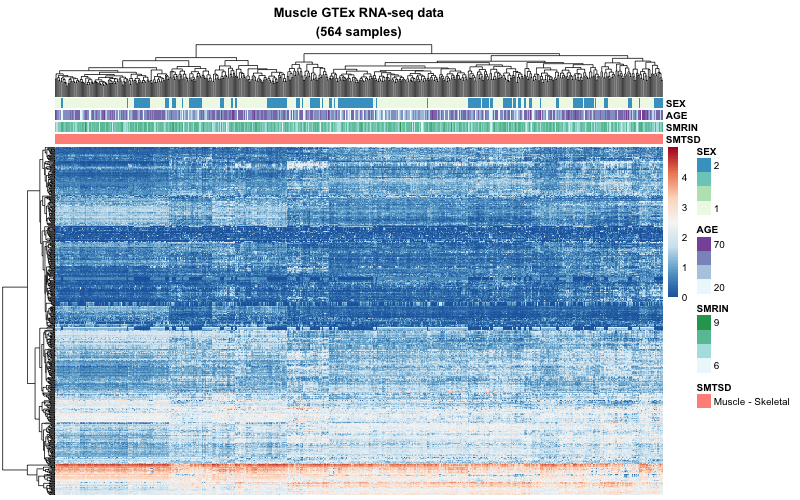

### Analyzing 137 Small Intestine samples.

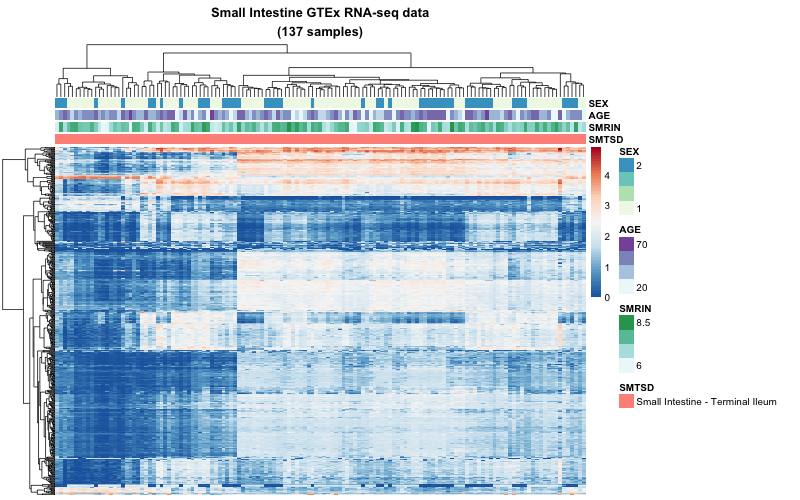

### Analyzing 600 Heart samples.

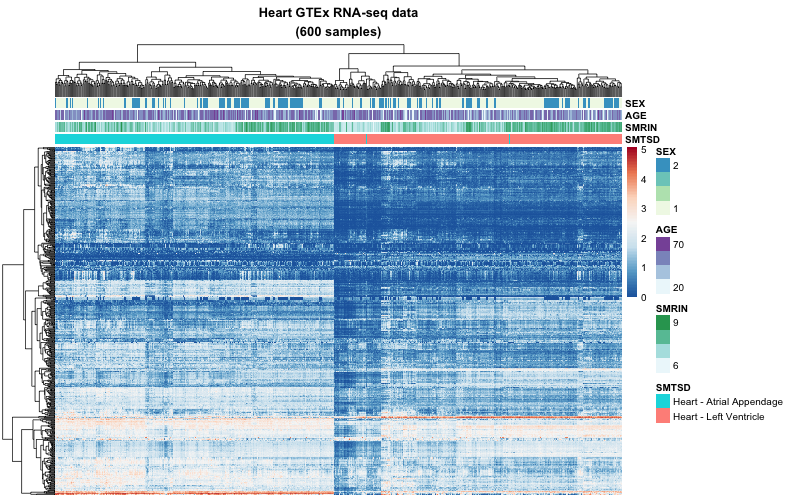

### Analyzing 427 Lung samples.

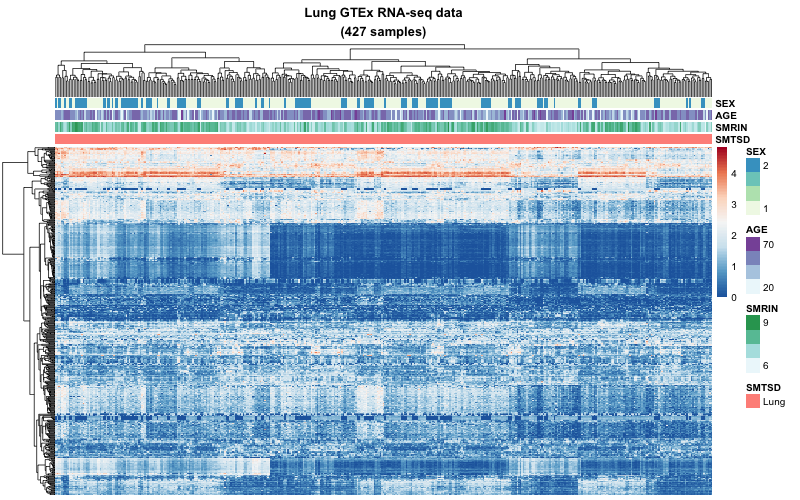

### Analyzing 507 Colon samples.

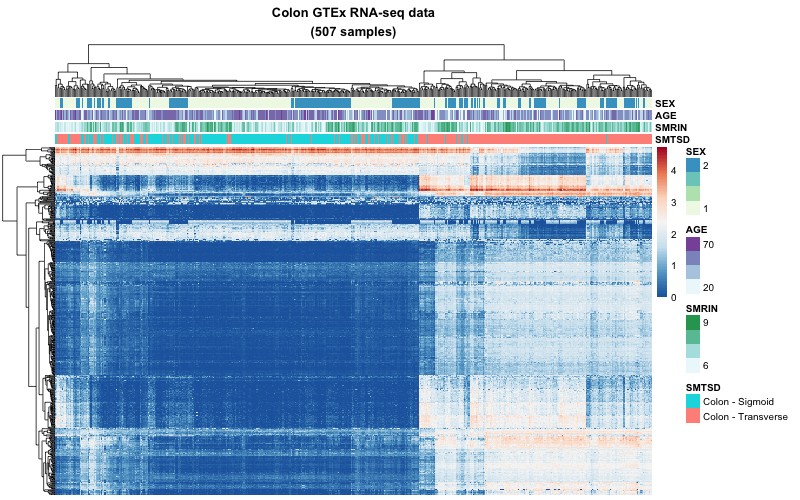

### Analyzing 537 Blood samples.

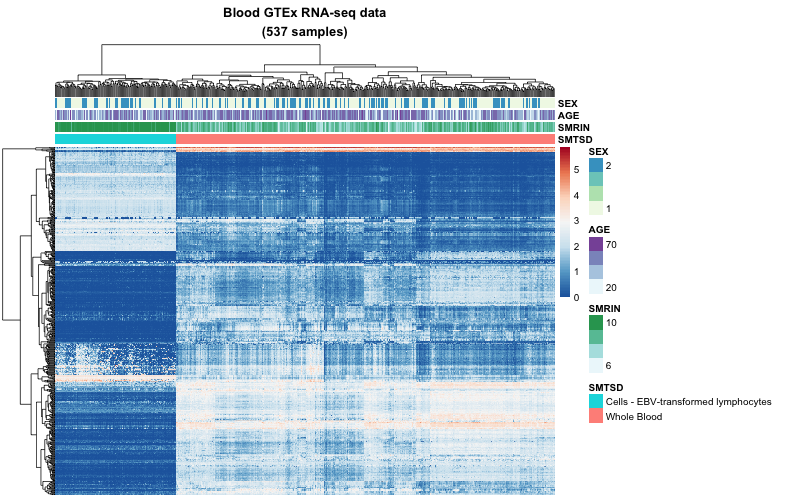

### Analyzing 115 Vagina samples.

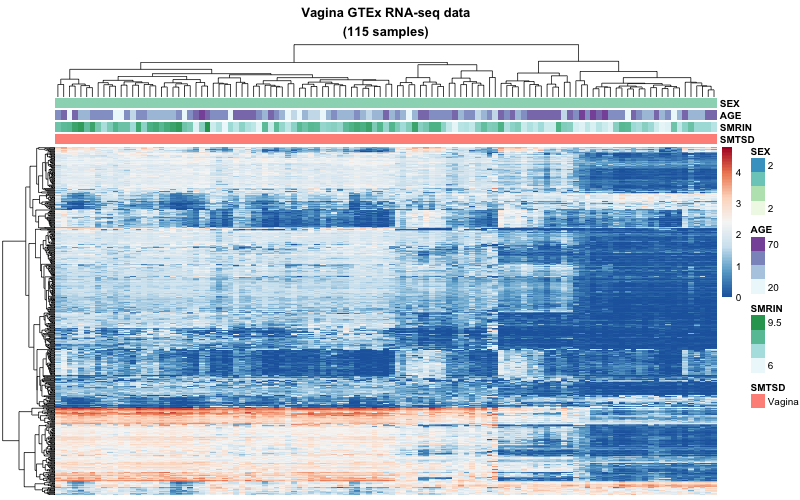

### Analyzing 248 Pancreas samples.

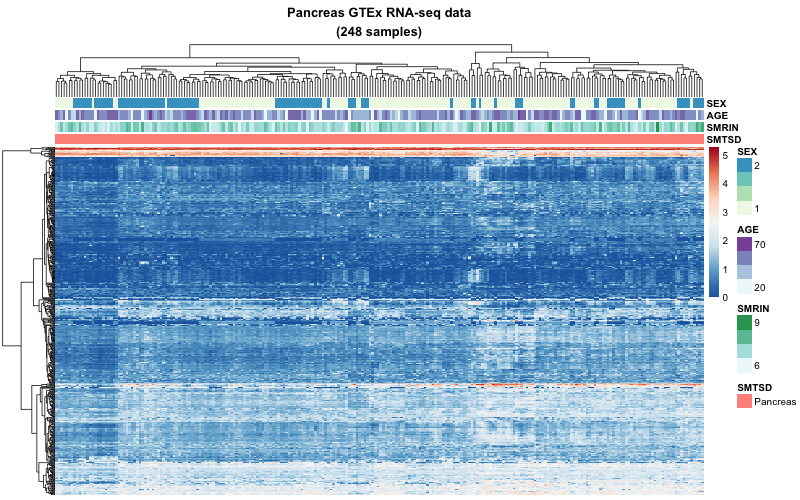

### Analyzing 290 Breast samples.

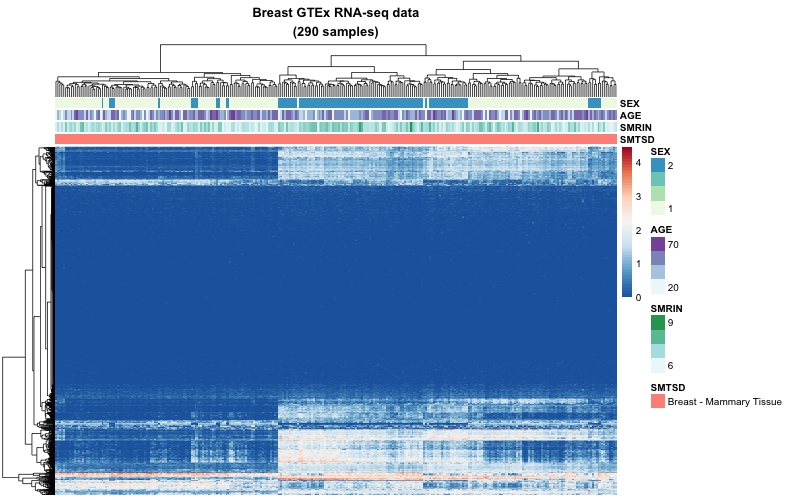

### Analyzing 175 Liver samples.

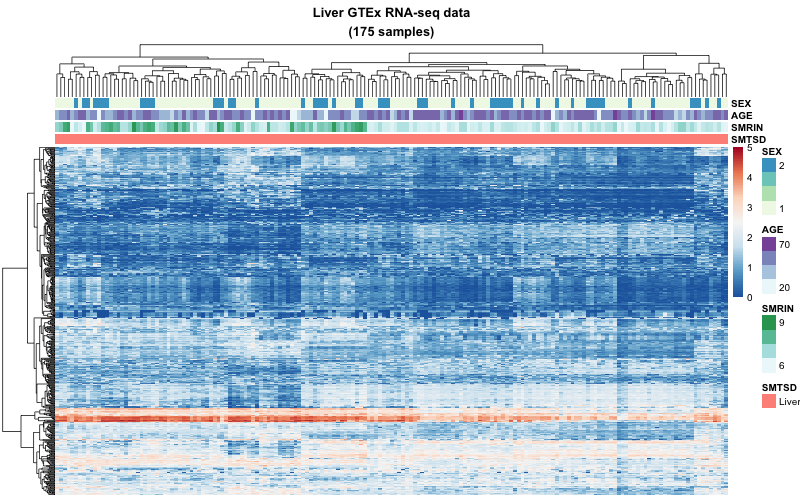

### Analyzing 1671 Brain samples.

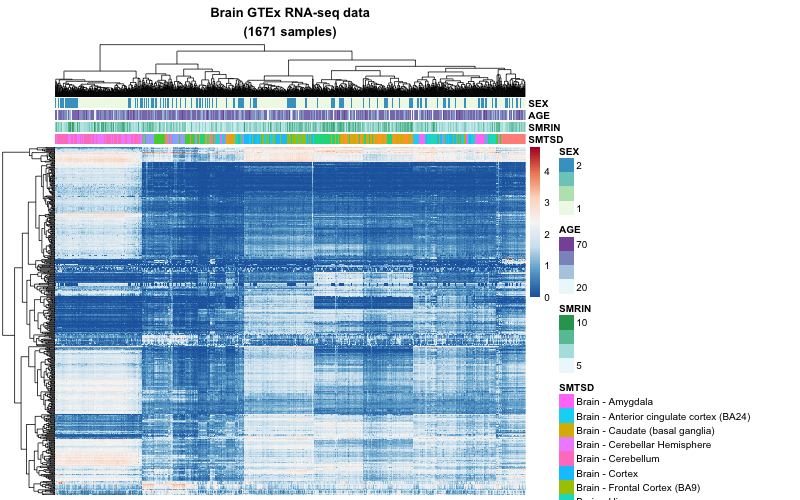

### Analyzing 414 Nerve samples.

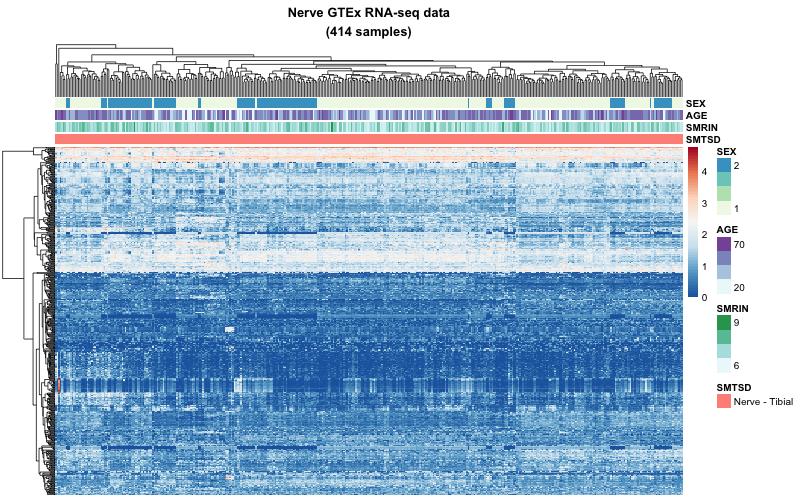

### Analyzing 262 Stomach samples.

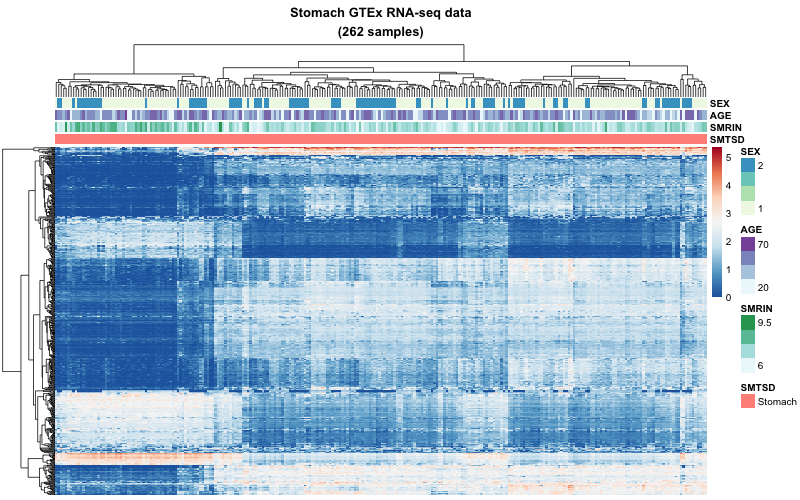

### Analyzing 797 Adipose Tissue samples.

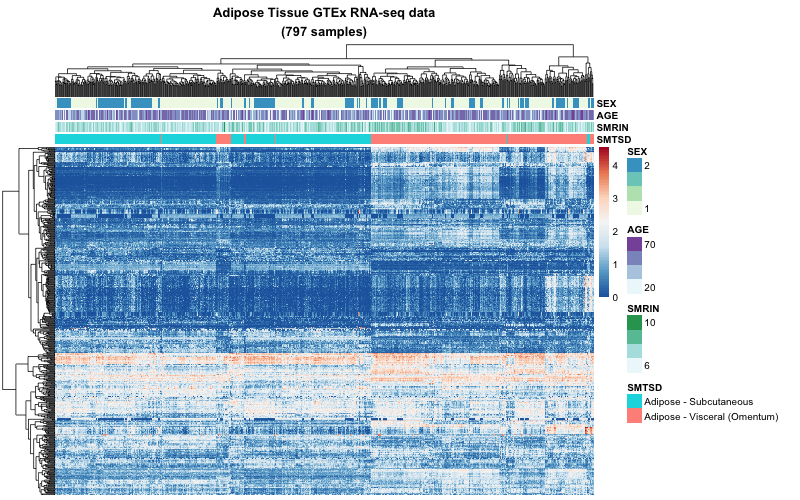

### Analyzing 133 Ovary samples.

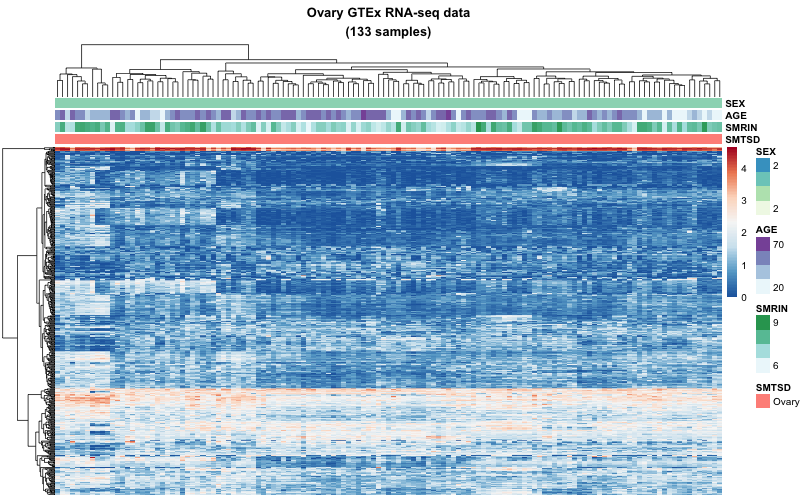

### Analyzing 1203 Skin samples.

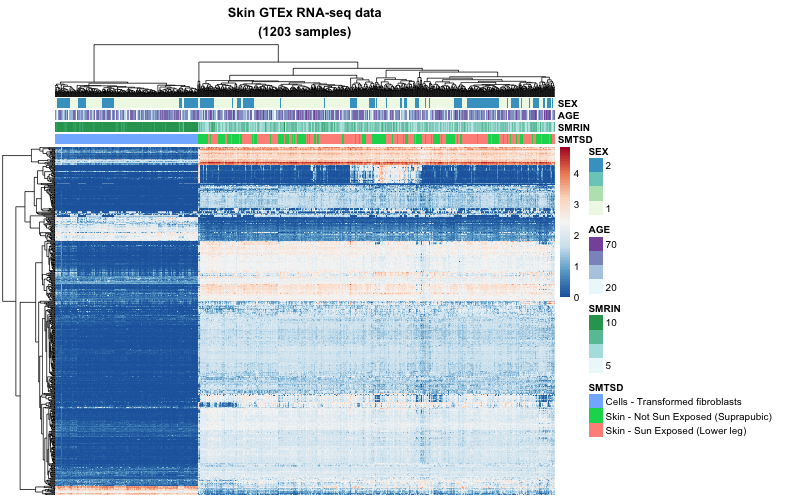

### Analyzing 446 Thyroid samples.

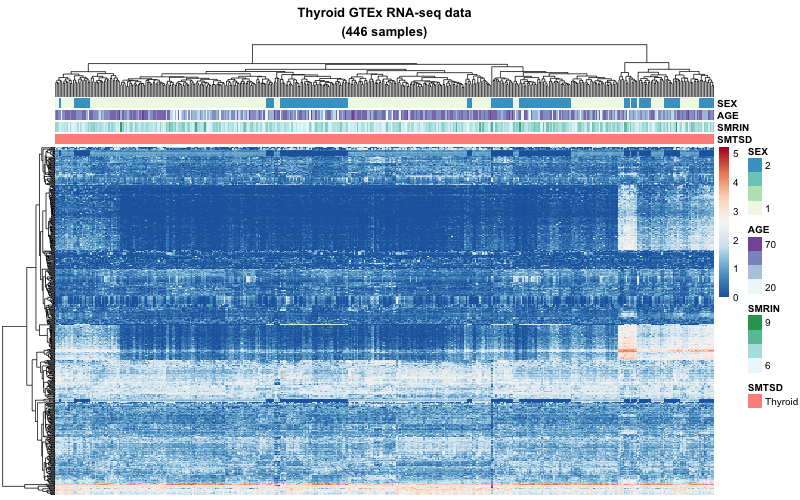

### Analyzing 183 Pituitary samples.

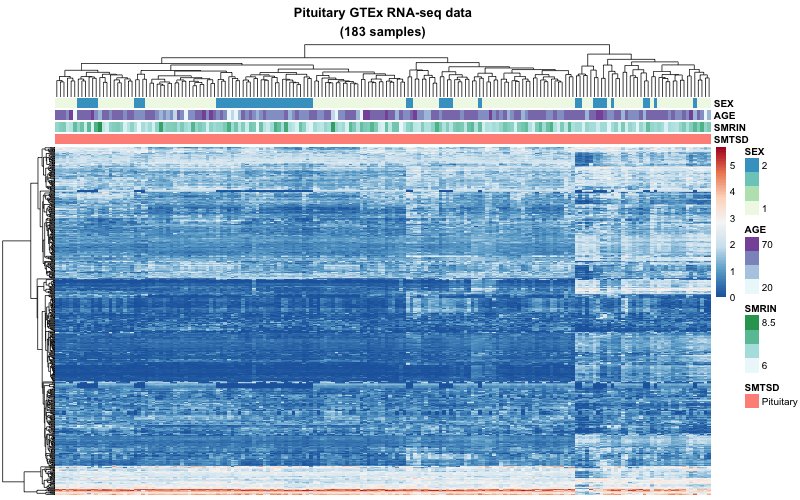

### Analyzing 1021 Esophagus samples.

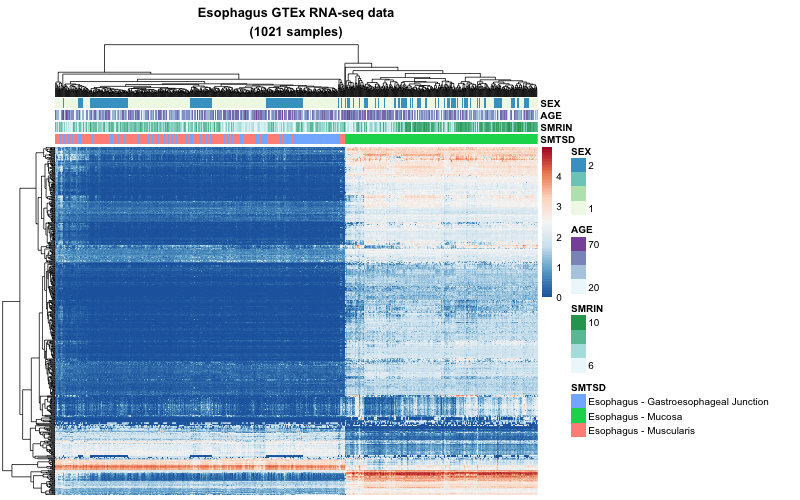

### Analyzing 913 Blood Vessel samples.

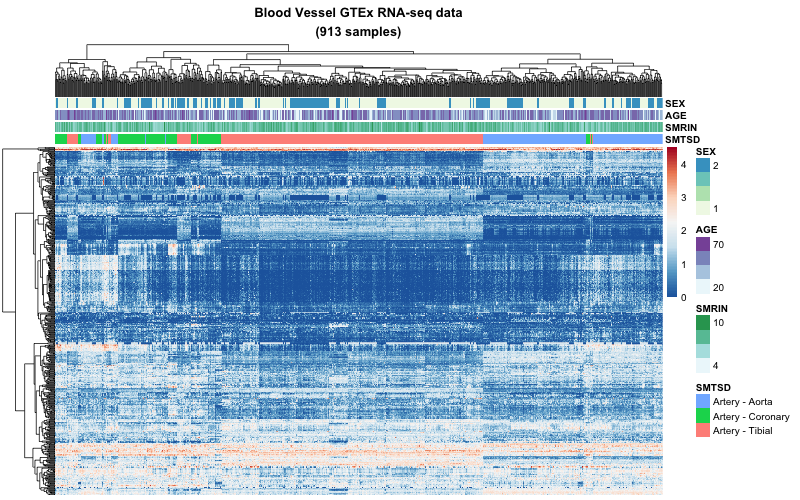

### Analyzing 97 Salivary Gland samples.

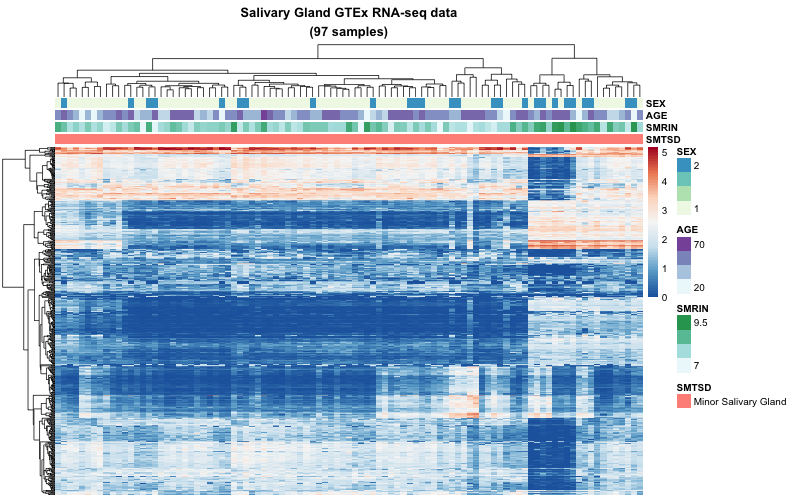

### Analyzing 190 Adrenal Gland samples.

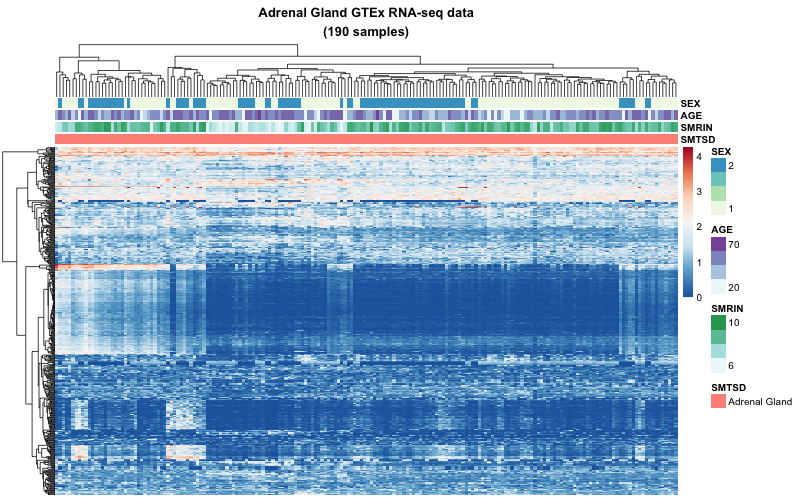

### Analyzing 45 Kidney samples.

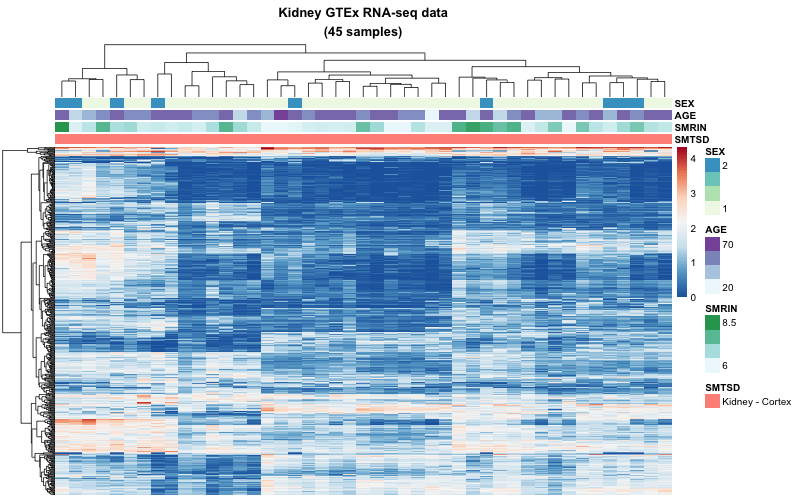

### Analyzing 152 Prostate samples.

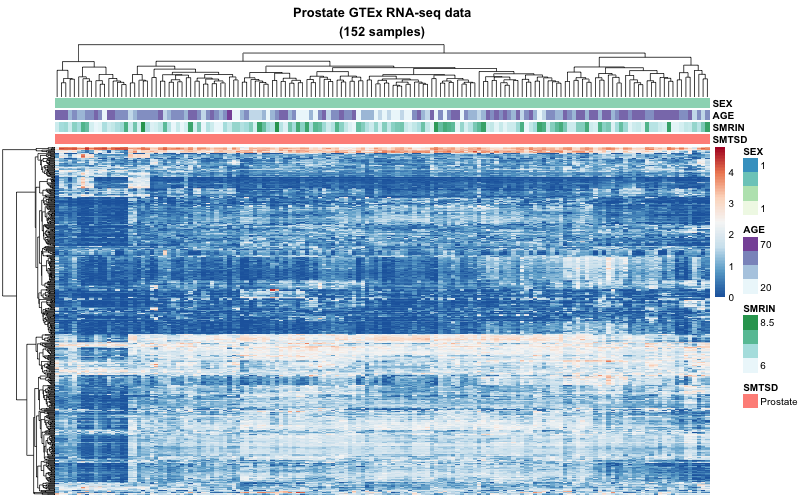

### Analyzing 259 Testis samples.

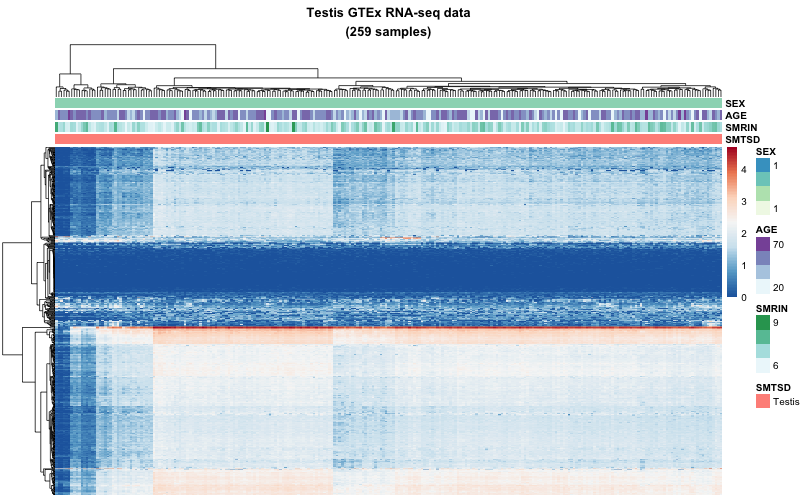

### Analyzing 162 Spleen samples.

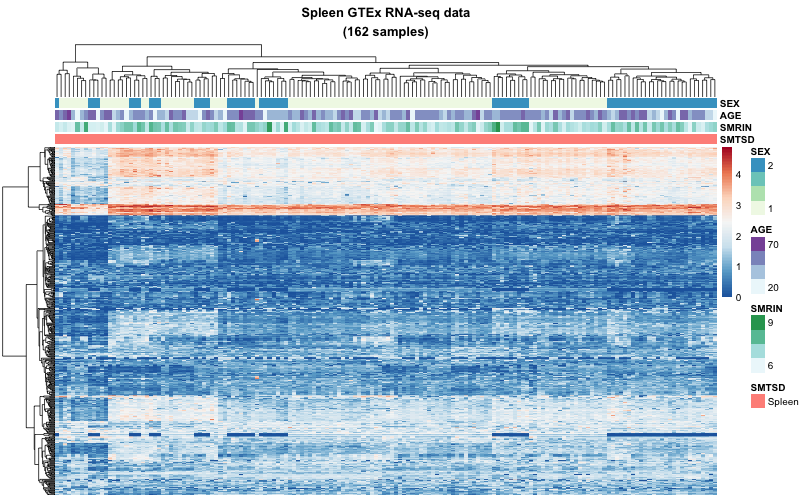

### Analyzing 111 Uterus samples.

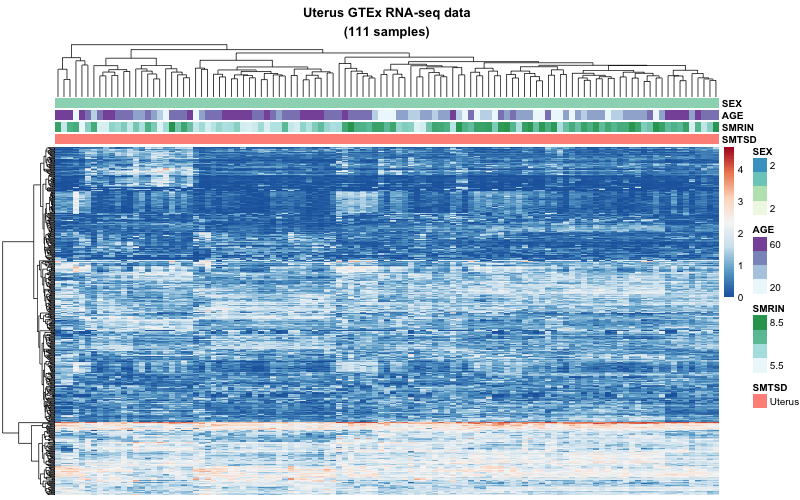

### Analyzing 7 Fallopian Tube samples.

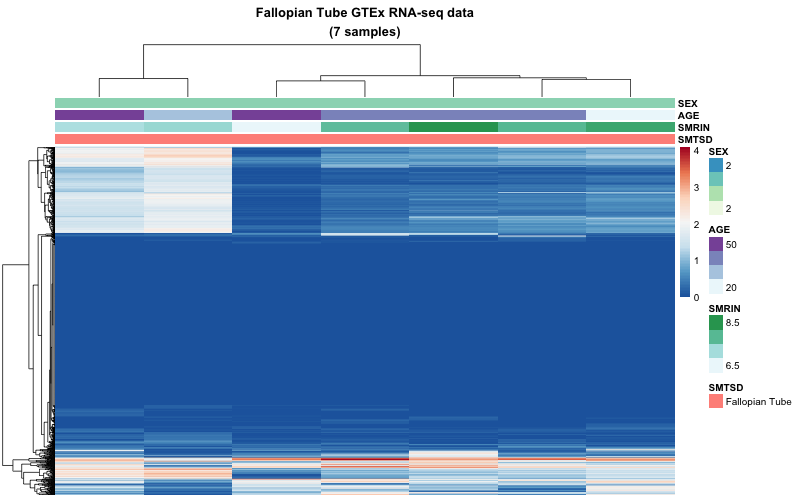

### Analyzing 11 Cervix Uteri samples.

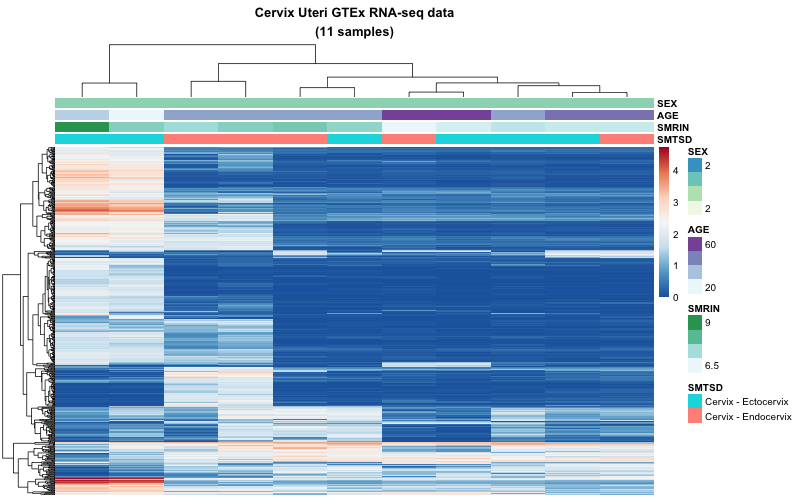

### Analyzing 11 Bladder samples.

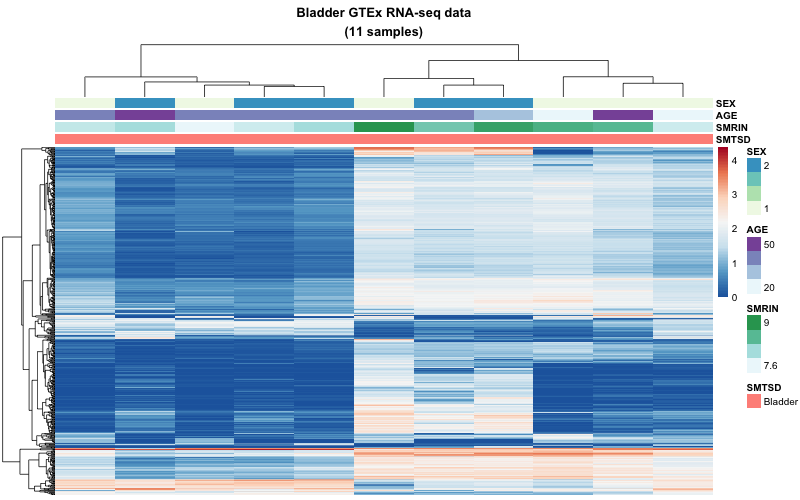

In [10]:
for tissue in metadata['SMTS'].unique():
    plot(tissue)

In [51]:
def plot(tissue, age=None, gender=None, metadata_cols = ['SMTSD', 'SMRIN', 'AGE', 'SEX']):

    # Subset
    metadata_subset = metadata[metadata['SMTS'] == tissue][metadata_cols]
    if age:
        metadata_subset = metadata_subset[[x in age for x in metadata_subset['AGE']]]
    if gender:
        metadata_subset = metadata_subset[metadata_subset['SEX'] == gender]
    tpm_subset = tpm[metadata_subset.index]
    tpm_log = np.log10(tpm_subset+1)

    # Filter
    metadata_subset.index = [x.replace('-', '.') for x in metadata_subset.index]
    tpm_filter = tpm_log.loc[tpm_log.var(axis=1).sort_values(ascending=False).index[:500]].T.apply(ss.zscore).T
    
    # Print samples
    nr = len(metadata_subset.index)
    display(Markdown('### Analyzing {nr} {tissue} samples.'.format(**locals())))
    
    %R -h 500 -w 800 -i tpm_filter,metadata_subset,tissue hm <- pheatmap(tpm_filter, cutree_col=3, annotation_col=metadata_subset, color=colorRampPalette(rev(brewer.pal(n = 7, name = "RdBu")))(100), show_rownames=F, show_colnames=F, main=paste0(tissue, ' GTEx RNA-seq data\n(',ncol(tpm_filter),' samples)'))#, annotation_col=metadata_subset)

### Analyzing 111 Brain samples.

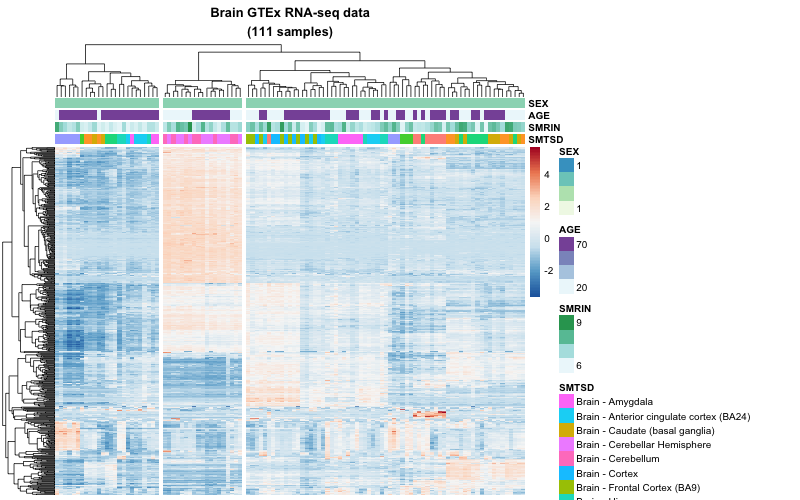

In [52]:
plot(tissue='Brain', age=[20, 70], gender=1)

In [67]:
%%R
paste(hm$tree_col$labels[hm$tree_col$order], collapse="', '")

[1] "GTEX.T5JC.0011.R9A.SM.32PLV', 'GTEX.14E7W.0011.R9a.SM.62LE6', 'GTEX.17EVQ.0011.R9b.SM.79OJY', 'GTEX.148VJ.0011.R9b.SM.5SI77', 'GTEX.1BAJH.0011.R9b.SM.7EPIQ', 'GTEX.13N1W.0011.R9b.SM.5MR4R', 'GTEX.13SLW.0011.R2b.SM.5O9C6', 'GTEX.14E7W.0011.R7b.SM.5ZZV4', 'GTEX.17EVQ.0011.R7a.SM.7EWDA', 'GTEX.17EVQ.0011.R5a.SM.7LT92', 'GTEX.12WSE.0011.R7a.SM.5PNWF', 'GTEX.13IVO.0011.R5a.SM.5L3CY', 'GTEX.13IVO.0011.R6b.SM.5K7X9', 'GTEX.13SLW.0011.R6a.SM.5O9BH', 'GTEX.17EVQ.0011.R6a.SM.7189U', 'GTEX.17EVQ.0011.R1a.SM.7189S', 'GTEX.14E7W.0011.R1b.SM.5YYAT', 'GTEX.13IVO.0011.R3b.SM.5IJBJ', 'GTEX.17EVQ.0011.R4b.SM.7LT94', 'GTEX.148VJ.0011.R3b.SM.69LQJ', 'GTEX.17EVQ.0011.R3b.SM.7LT9B', 'GTEX.14E7W.0011.R3b.SM.5YYB5', 'GTEX.13SLW.0011.R1a.SM.5S2W7', 'GTEX.13SLW.0011.R4b.SM.5S2W2', 'GTEX.13OVH.0011.R4a.SM.5KM3W', 'GTEX.12WSE.2926.SM.5RQJ9', 'GTEX.12WSE.0011.R11b.SM.5P9JW', 'GTEX.12126.0926.SM.5FQTW', 'GTEX.12126.0011.R11a.SM.5BC6X', 'GTEX.R55E.0011.R11A.SM.2TC6I', 'GTEX.T5JC.2326.SM.32PMR', 'GTEX.T5JC.0011.

In [125]:
logcpm = pd.read_table('/Users/denis/Desktop/logcpm.txt', sep='\t', index_col='Unnamed: 0')
logcpm.head()

,GTEX-WHSE-0011-R7A-SM-3P5YZ,GTEX-14E7W-0011-R1b-SM-5YYAT,GTEX-T5JC-2326-SM-32PMR,GTEX-WHSE-0011-R3A-SM-3P5ZM,GTEX-13IVO-0011-R8a-SM-5L3DY,GTEX-17EVQ-0011-R5a-SM-7LT92,GTEX-T5JC-0011-R10A-SM-32PM2,GTEX-13N1W-0011-R6a-SM-5MR43,GTEX-14E7W-0011-R6b-SM-5ZZV3,GTEX-T5JC-0011-R5A-SM-32PLK,...,GTEX-14E7W-0011-R4b-SM-62LEA,GTEX-R55E-0011-R5A-SM-2TC5N,GTEX-17EVQ-0011-R1a-SM-7189S,GTEX-T5JC-0011-R11A-SM-32PMB,GTEX-12WSF-0011-R11a-SM-5LZVT,GTEX-1BAJH-0011-R11b-SM-7IGLM,GTEX-WHSE-0011-R8A-SM-3P5Z1,GTEX-13OVH-0011-R6b-SM-5LUAX,GTEX-12WSF-0011-R4b-SM-5HL88,GTEX-13SLW-0011-R6a-SM-5O9BH
A1BG,0.892131,0.853401,0.966685,1.071498,1.057345,0.891482,0.674545,0.923299,0.850796,0.607512,...,0.825072,0.904856,0.780831,0.894897,1.048690,0.801961,1.031602,0.894338,0.895685,0.976511
A1CF,0.062041,0.050423,0.030750,0.031805,0.028865,0.006335,0.000000,0.035268,0.053470,0.016873,...,0.000000,0.000000,0.000000,0.022261,0.023875,0.000000,0.017925,0.000000,0.030378,0.000000
A2M,2.113773,1.804735,2.262774,2.019858,2.329615,1.738529,2.235883,2.185229,1.738826,1.841230,...,2.241689,2.085457,2.090388,2.524095,2.167193,1.998239,1.755719,1.563834,1.412778,1.699671
A2ML1,0.440123,0.454340,0.621623,1.059436,0.279862,0.463942,1.393160,0.829470,0.493899,0.562811,...,0.766879,1.195110,0.711590,1.329217,0.286110,0.273153,0.562846,0.909874,0.292252,0.360655
A3GALT2,0.070223,0.088386,0.140360,0.082409,0.024186,0.030792,0.000000,0.009089,0.045003,0.000000,...,0.011230,0.008689,0.000000,0.016802,0.062736,0.007252,0.119266,0.072514,0.116581,0.099979


In [130]:
tpm = tpm.reindex(logcpm.columns, axis=1).reset_index().groupby('Description').mean()
tpm.head()

,GTEX-WHSE-0011-R7A-SM-3P5YZ,GTEX-14E7W-0011-R1b-SM-5YYAT,GTEX-T5JC-2326-SM-32PMR,GTEX-WHSE-0011-R3A-SM-3P5ZM,GTEX-13IVO-0011-R8a-SM-5L3DY,GTEX-17EVQ-0011-R5a-SM-7LT92,GTEX-T5JC-0011-R10A-SM-32PM2,GTEX-13N1W-0011-R6a-SM-5MR43,GTEX-14E7W-0011-R6b-SM-5ZZV3,GTEX-T5JC-0011-R5A-SM-32PLK,...,GTEX-14E7W-0011-R4b-SM-62LEA,GTEX-R55E-0011-R5A-SM-2TC5N,GTEX-17EVQ-0011-R1a-SM-7189S,GTEX-T5JC-0011-R11A-SM-32PMB,GTEX-12WSF-0011-R11a-SM-5LZVT,GTEX-1BAJH-0011-R11b-SM-7IGLM,GTEX-WHSE-0011-R8A-SM-3P5Z1,GTEX-13OVH-0011-R6b-SM-5LUAX,GTEX-12WSF-0011-R4b-SM-5HL88,GTEX-13SLW-0011-R6a-SM-5O9BH
Description,,,,,,,,,,,,,,,,,,,,,
5S_rRNA,0.027786,0.000000,0.062143,0.000000,0.073714,0.000000,0.088071,0.046771,0.000000,0.000000,...,0.000000,0.057600,0.000000,0.000000,0.000000,0.000000,0.032500,0.000000,0.000000,0.058611
7SK,0.047450,0.319286,0.020957,0.102893,0.161571,0.140389,0.063876,0.069657,0.049519,0.048486,...,0.061287,0.228403,0.184673,0.036557,0.044471,0.038157,0.188731,0.124729,0.084711,0.093717
A1BG,5.609000,4.791000,6.592000,3.636000,2.197000,2.168000,2.783000,4.791000,5.675000,3.507000,...,13.780000,5.273000,3.256000,7.887000,7.024000,6.004000,6.460000,5.088000,5.333000,2.738000
A1BG-AS1,1.839000,2.015000,5.266000,2.776000,0.834400,0.493000,3.925000,1.384000,0.896400,0.770400,...,1.436000,2.006000,1.407000,5.410000,4.028000,4.377000,2.321000,1.881000,1.147000,0.713800
A1CF,0.009870,0.005408,0.022070,0.000000,0.006545,0.000000,0.003976,0.004152,0.007032,0.000000,...,0.000000,0.000000,0.001655,0.012830,0.049290,0.032730,0.000000,0.003995,0.000000,0.009633


In [131]:
common_genes = set(logcpm.index).intersection(set(tpm.index))
logcpm = logcpm.reindex(common_genes)
tpm = tpm.reindex(common_genes)
tpm.head()

,GTEX-WHSE-0011-R7A-SM-3P5YZ,GTEX-14E7W-0011-R1b-SM-5YYAT,GTEX-T5JC-2326-SM-32PMR,GTEX-WHSE-0011-R3A-SM-3P5ZM,GTEX-13IVO-0011-R8a-SM-5L3DY,GTEX-17EVQ-0011-R5a-SM-7LT92,GTEX-T5JC-0011-R10A-SM-32PM2,GTEX-13N1W-0011-R6a-SM-5MR43,GTEX-14E7W-0011-R6b-SM-5ZZV3,GTEX-T5JC-0011-R5A-SM-32PLK,...,GTEX-14E7W-0011-R4b-SM-62LEA,GTEX-R55E-0011-R5A-SM-2TC5N,GTEX-17EVQ-0011-R1a-SM-7189S,GTEX-T5JC-0011-R11A-SM-32PMB,GTEX-12WSF-0011-R11a-SM-5LZVT,GTEX-1BAJH-0011-R11b-SM-7IGLM,GTEX-WHSE-0011-R8A-SM-3P5Z1,GTEX-13OVH-0011-R6b-SM-5LUAX,GTEX-12WSF-0011-R4b-SM-5HL88,GTEX-13SLW-0011-R6a-SM-5O9BH
Description,,,,,,,,,,,,,,,,,,,,,
ARL2BP,39.2800,41.6400,53.1400,34.0200,42.740,20.2800,64.6400,52.2100,63.85000,39.7000,...,59.63000,47.2300,24.4000,59.860,59.9300,54.270,49.0400,40.770,30.2300,27.2100
IL2,0.0000,0.0000,0.0000,0.0000,0.000,0.0000,0.0000,0.0000,0.00000,0.0000,...,0.00000,0.0000,0.0000,0.000,0.0000,0.000,0.0000,0.000,0.0000,0.0000
GAGE10,0.4231,0.3709,0.6622,0.1348,1.010,0.1902,0.3409,0.2848,0.06028,0.4849,...,0.06384,0.7015,0.1987,0.330,0.3381,0.102,0.2474,1.439,0.3009,0.9635
ZCCHC7,3.5470,4.2300,7.0880,3.0770,5.596,2.5680,4.1260,4.7780,5.24800,2.4840,...,5.34300,4.3850,2.9420,7.708,8.0300,6.072,4.5620,3.203,3.4220,2.3000
TGFA,6.9210,11.5900,3.9790,2.9520,3.783,5.8750,4.5600,11.0500,9.36500,5.5990,...,20.40000,9.1350,8.7350,4.161,2.6200,4.779,10.0800,4.775,8.7150,1.3790


In [147]:
tpm = np.log10(tpm+1)

In [148]:
logcpm_g = logcpm.var(axis=1).sort_values(ascending=False).index[:500]
tpm_g = tpm.var(axis=1).sort_values(ascending=False).index[:500]
len(set(logcpm_g).intersection(set(tpm_g)))

381

In [149]:
logcpm_f = logcpm.loc[logcpm_g]
tpm_f = tpm.loc[tpm_g]

In [150]:
import seaborn as sns
%matplotlib inline

In [151]:
tpm_f.head()

,GTEX-WHSE-0011-R7A-SM-3P5YZ,GTEX-14E7W-0011-R1b-SM-5YYAT,GTEX-T5JC-2326-SM-32PMR,GTEX-WHSE-0011-R3A-SM-3P5ZM,GTEX-13IVO-0011-R8a-SM-5L3DY,GTEX-17EVQ-0011-R5a-SM-7LT92,GTEX-T5JC-0011-R10A-SM-32PM2,GTEX-13N1W-0011-R6a-SM-5MR43,GTEX-14E7W-0011-R6b-SM-5ZZV3,GTEX-T5JC-0011-R5A-SM-32PLK,...,GTEX-14E7W-0011-R4b-SM-62LEA,GTEX-R55E-0011-R5A-SM-2TC5N,GTEX-17EVQ-0011-R1a-SM-7189S,GTEX-T5JC-0011-R11A-SM-32PMB,GTEX-12WSF-0011-R11a-SM-5LZVT,GTEX-1BAJH-0011-R11b-SM-7IGLM,GTEX-WHSE-0011-R8A-SM-3P5Z1,GTEX-13OVH-0011-R6b-SM-5LUAX,GTEX-12WSF-0011-R4b-SM-5HL88,GTEX-13SLW-0011-R6a-SM-5O9BH
Description,,,,,,,,,,,,,,,,,,,,,
SLC17A7,0.335859,1.851136,2.922310,2.805705,0.167672,0.086929,3.004751,0.268157,1.578983,0.588944,...,2.368845,0.406199,1.381656,2.934246,2.709863,2.597146,0.479863,0.612678,2.436799,0.214049
NRGN,3.599228,2.074451,0.532754,3.181558,1.778947,2.209515,3.558469,2.271377,3.049218,3.268344,...,2.870521,3.463594,1.829432,0.669782,0.452706,0.449015,1.862906,2.441224,2.922206,2.131619
DDN,2.591065,1.511215,0.198162,2.867939,0.810098,1.678700,2.776338,1.242790,2.328991,2.772028,...,2.029789,2.619093,1.500374,0.171873,0.119157,0.056371,0.920436,2.075547,2.241297,2.048830
CBLN1,0.475962,0.279667,2.937718,0.566320,1.542203,0.327972,1.057666,1.112605,0.545678,0.592954,...,0.586587,0.711554,0.201042,2.937317,2.833402,2.781396,1.691877,0.311966,0.286905,0.140665
CBLN3,0.290524,0.486430,2.925621,0.648750,0.432328,0.209300,0.623249,0.596487,0.369587,0.538825,...,0.559787,0.599992,0.249125,2.940616,2.840796,2.823735,0.909610,0.660391,0.392697,0.365113


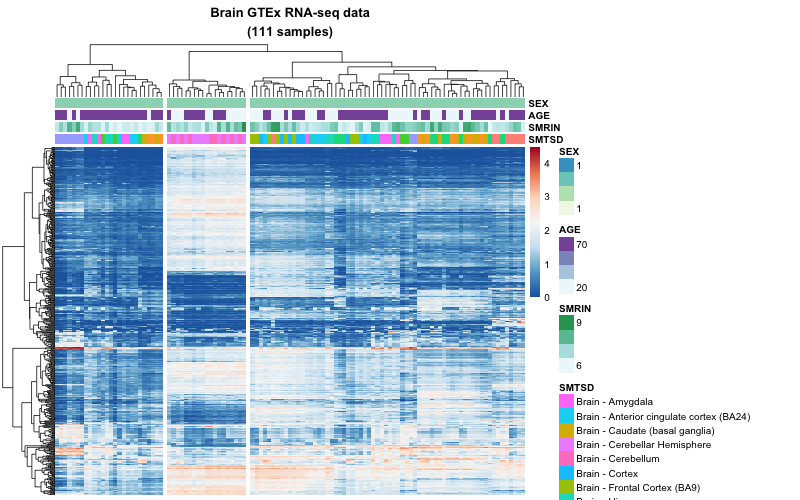

In [158]:
%R -h 500 -w 800 -i tpm_f hm <- pheatmap(tpm_f, cutree_col=3, annotation_col=metadata_subset, color=colorRampPalette(rev(brewer.pal(n = 7, name = "RdBu")))(100), show_rownames=F, show_colnames=F, main=paste0(tissue, ' GTEx RNA-seq data\n(',ncol(tpm_filter),' samples)'));#, annotation_col=metadata_subset);

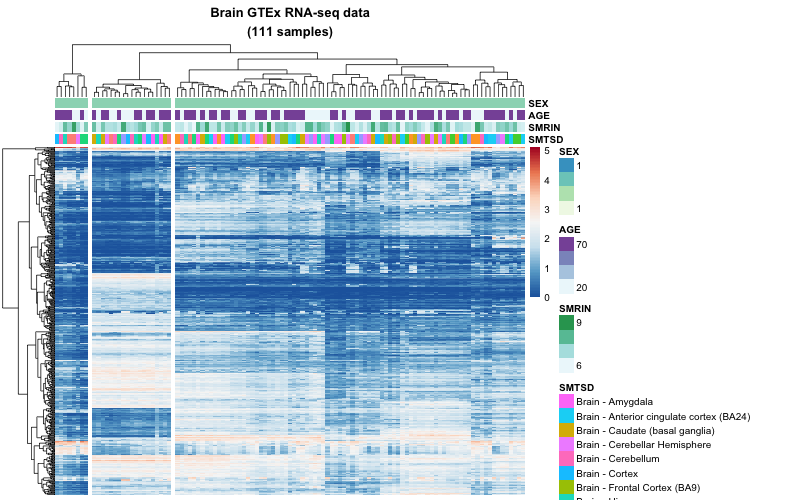

In [160]:
%R -h 500 -w 800 -i logcpm_f hm <- pheatmap(logcpm_f, cutree_col=3, annotation_col=metadata_subset, color=colorRampPalette(rev(brewer.pal(n = 7, name = "RdBu")))(100), show_rownames=F, show_colnames=F, main=paste0(tissue, ' GTEx RNA-seq data\n(',ncol(tpm_filter),' samples)'));#, annotation_col=metadata_subset);

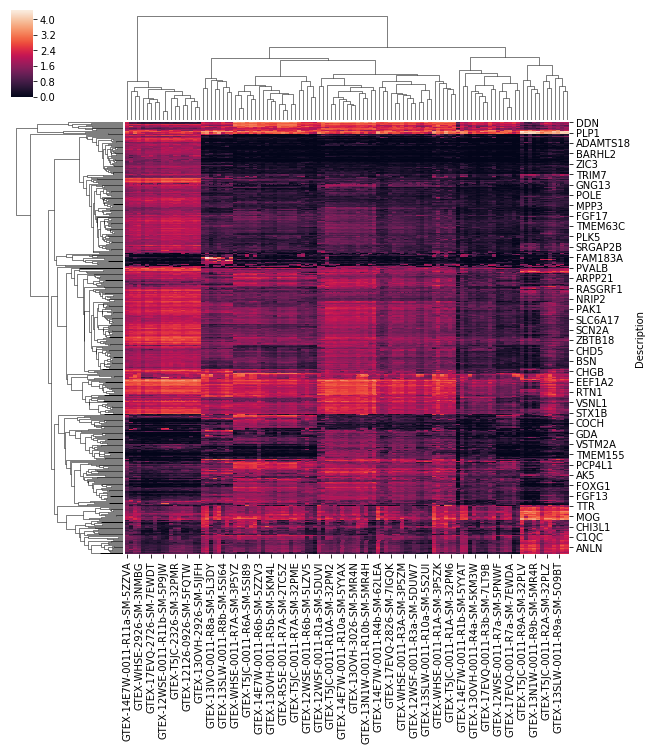

In [165]:
tpm_hm = sns.clustermap(tpm_f);

In [182]:
a = [tpm.columns[i] for i in tpm_hm.dendrogram_col.reordered_ind][:15]
a

['GTEX-14E7W-0011-R11a-SM-5ZZVA',
 'GTEX-R55E-2526-SM-2TC6H',
 'GTEX-WHSE-0011-R11A-SM-3P5YY',
 'GTEX-WHSE-2926-SM-3NMBG',
 'GTEX-17EVQ-0011-R11a-SM-7LT9C',
 'GTEX-13SLW-0011-R11a-SM-5SI8Q',
 'GTEX-17EVQ-2726-SM-7EWDT',
 'GTEX-12WSF-0011-R11a-SM-5LZVT',
 'GTEX-1BAJH-0011-R11b-SM-7IGLM',
 'GTEX-12WSE-0011-R11b-SM-5P9JW',
 'GTEX-12WSE-2926-SM-5RQJ9',
 'GTEX-R55E-0011-R11A-SM-2TC6I',
 'GTEX-T5JC-2326-SM-32PMR',
 'GTEX-T5JC-0011-R11A-SM-32PMB',
 'GTEX-12126-0011-R11a-SM-5BC6X']

In [183]:
b = [logcpm.columns[i] for i in logcpm_hm.dendrogram_col.reordered_ind][:15]
b

['GTEX-12WSE-0011-R1b-SM-5GU4V',
 'GTEX-13N1W-0011-R4a-SM-5MR52',
 'GTEX-13SLW-0011-R5b-SM-5SI6Z',
 'GTEX-13SLW-0011-R8b-SM-5SI64',
 'GTEX-T5JC-0011-R9A-SM-32PLV',
 'GTEX-T5JC-2426-SM-3NMDB',
 'GTEX-13N1W-0011-R5b-SM-5MR5Q',
 'GTEX-R55E-0011-R1A-SM-2TC6N',
 'GTEX-13OVH-0011-R5b-SM-5KM4L',
 'GTEX-17EVQ-0011-R11a-SM-7LT9C',
 'GTEX-WHSE-0011-R8A-SM-3P5Z1',
 'GTEX-12126-0926-SM-5FQTW',
 'GTEX-13SLW-0011-R6a-SM-5O9BH',
 'GTEX-R55E-2526-SM-2TC6H',
 'GTEX-14E7W-0011-R1b-SM-5YYAT']

In [184]:
set(a).intersection(set(b))

{'GTEX-17EVQ-0011-R11a-SM-7LT9C', 'GTEX-R55E-2526-SM-2TC6H'}

In [168]:
tpm_hm.dendrogram_col.xticks

['__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__weakref__',
 '_calculate_linkage_fastcluster',
 '_calculate_linkage_scipy',
 'array',
 'axis',
 'calculate_dendrogram',
 'calculated_linkage',
 'data',
 'dendrogram',
 'dependent_coord',
 'independent_coord',
 'label',
 'linkage',
 'method',
 'metric',
 'plot',
 'reordered_ind',
 'rotate',
 'shape',
 'xlabel',
 'xticklabels',
 'xticks',
 'ylabel',
 'yticklabels',
 'yticks']

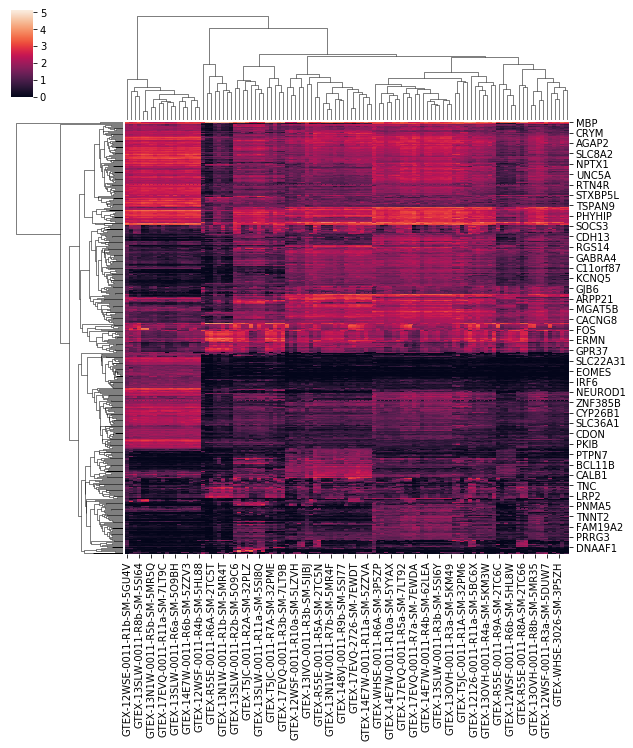

In [178]:
logcpm_hm = sns.clustermap(logcpm_f);

In [121]:
logcpm.corrwith(tpm_f['GTEX-14E7W-0011-R1b-SM-5YYAT']).sort_values(ascending=False)

GTEX-14E7W-0011-R3b-SM-5YYB5     0.928131
GTEX-R55E-0011-R8A-SM-2TC66      0.722768
GTEX-T5JC-0011-R11A-SM-32PMB     0.646051
GTEX-12WSF-0011-R5a-SM-5HL8K     0.459822
GTEX-12WSF-0011-R1a-SM-5DUVI     0.444411
GTEX-T5JC-0011-R8A-SM-32PLM      0.382821
GTEX-R55E-0011-R5A-SM-2TC5N      0.370887
GTEX-13IVO-0011-R5a-SM-5L3CY     0.336193
GTEX-12WSF-0011-R6b-SM-5HL8W     0.326069
GTEX-13SLW-0011-R4b-SM-5S2W2     0.309673
GTEX-12126-0011-R11a-SM-5BC6X    0.306592
GTEX-17EVQ-2826-SM-7IGQK         0.304808
GTEX-1BAJH-0011-R9b-SM-7EPIQ     0.296737
GTEX-13N1W-0011-R10b-SM-5MR4H    0.294636
GTEX-WHSE-0011-R11A-SM-3P5YY     0.293579
GTEX-WHSE-3026-SM-3P5ZH          0.288962
GTEX-T5JC-0011-R7A-SM-32PME      0.288380
GTEX-R55E-0011-R4A-SM-2TC5H      0.281050
GTEX-12WSF-0011-R3a-SM-5DUW7     0.249830
GTEX-13IVO-0011-R8a-SM-5L3DY     0.248572
GTEX-13N1W-0011-R1b-SM-5MR4T     0.245562
GTEX-14E7W-2926-SM-5S2R8         0.214819
GTEX-1BAJH-0011-R11b-SM-7IGLM    0.205111
GTEX-13IVO-0011-R6b-SM-5K7X9     0

In [66]:
logcpm = ['GTEX.12WSE.0011.R7a.SM.5PNWF', 'GTEX.T5JC.0011.R7A.SM.32PME', 'GTEX.T5JC.2326.SM.32PMR', 'GTEX.13OVH.3026.SM.5MR4N', 'GTEX.17EVQ.0011.R3b.SM.7LT9B', 'GTEX.T5JC.0011.R11A.SM.32PMB', 'GTEX.R55E.0011.R8A.SM.2TC66', 'GTEX.14E7W.0011.R3b.SM.5YYB5', 'GTEX.1BAJH.0011.R9b.SM.7EPIQ', 'GTEX.1BAJH.0011.R11b.SM.7IGLM', 'GTEX.13OVH.2926.SM.5IJFH', 'GTEX.T5JC.0011.R5A.SM.32PLK', 'GTEX.WHSE.3026.SM.3P5ZH', 'GTEX.13IVO.0011.R6b.SM.5K7X9', 'GTEX.R55E.0011.R6A.SM.2TC5T', 'GTEX.17EVQ.2826.SM.7IGQK', 'GTEX.14E7W.2926.SM.5S2R8', 'GTEX.13IVO.0011.R8a.SM.5L3DY', 'GTEX.T5JC.0011.R8A.SM.32PLM', 'GTEX.13N1W.0011.R1b.SM.5MR4T', 'GTEX.WHSE.0011.R11A.SM.3P5YY', 'GTEX.R55E.0011.R9A.SM.2TC6C', 'GTEX.12WSF.0011.R6b.SM.5HL8W', 'GTEX.13SLW.0011.R4b.SM.5S2W2', 'GTEX.R55E.0011.R4A.SM.2TC5H', 'GTEX.13N1W.0011.R10b.SM.5MR4H', 'GTEX.13N1W.0011.R5b.SM.5MR5Q', 'GTEX.R55E.0011.R1A.SM.2TC6N', 'GTEX.13OVH.0011.R5b.SM.5KM4L', 'GTEX.17EVQ.0011.R11a.SM.7LT9C', 'GTEX.WHSE.0011.R8A.SM.3P5Z1', 'GTEX.12126.0926.SM.5FQTW', 'GTEX.13SLW.0011.R6a.SM.5O9BH', 'GTEX.T5JC.0011.R9A.SM.32PLV', 'GTEX.T5JC.2426.SM.3NMDB', 'GTEX.R55E.2526.SM.2TC6H', 'GTEX.14E7W.0011.R1b.SM.5YYAT', 'GTEX.14E7W.0011.R6b.SM.5ZZV3', 'GTEX.R55E.0011.R11A.SM.2TC6I', 'GTEX.13IVO.2926.SM.5L3CZ', 'GTEX.12WSF.0011.R4b.SM.5HL88', 'GTEX.12WSE.0011.R1b.SM.5GU4V', 'GTEX.13N1W.0011.R4a.SM.5MR52', 'GTEX.13SLW.0011.R5b.SM.5SI6Z', 'GTEX.13SLW.0011.R8b.SM.5SI64', 'GTEX.17EVQ.0011.R7a.SM.7EWDA', 'GTEX.12WSE.2926.SM.5RQJ9', 'GTEX.17EVQ.0011.R8a.SM.7189T', 'GTEX.13OVH.0011.R6b.SM.5LUAX', 'GTEX.T5JC.0011.R4A.SM.32PLT', 'GTEX.17EVQ.0011.R5a.SM.7LT92', 'GTEX.T5JC.0011.R6A.SM.5SI89', 'GTEX.13OVH.0011.R3a.SM.5KM49', 'GTEX.14E7W.0011.R4b.SM.62LEA', 'GTEX.17EVQ.0011.R1a.SM.7189S', 'GTEX.WHSE.0011.R7A.SM.3P5YZ', 'GTEX.17EVQ.0011.R4b.SM.7LT94', 'GTEX.13SLW.0011.R3b.SM.5SI6Y', 'GTEX.12126.0011.R9b.SM.5BC6P', 'GTEX.WHSE.0011.R4A.SM.3P5ZN', 'GTEX.T5JC.0011.R1A.SM.32PM6', 'GTEX.12WSE.0011.R11b.SM.5P9JW', 'GTEX.12WSF.0011.R1a.SM.5DUVI', 'GTEX.12WSF.0011.R5a.SM.5HL8K', 'GTEX.13SLW.0011.R10a.SM.5S2UI', 'GTEX.WHSE.2926.SM.3NMBG', 'GTEX.12WSF.0011.R10a.SM.5LZVH', 'GTEX.13IVO.0011.R3b.SM.5IJBJ', 'GTEX.WHSE.0011.R2A.SM.3P5ZL', 'GTEX.12WSF.0011.R7b.SM.5HL99', 'GTEX.R55E.0011.R5A.SM.2TC5N', 'GTEX.17EVQ.0011.R9b.SM.79OJY', 'GTEX.17EVQ.2726.SM.7EWDT', 'GTEX.13IVO.0011.R10a.SM.5LZY3', 'GTEX.12WSF.0011.R11a.SM.5LZVT', 'GTEX.WHSE.0011.R5A.SM.3P5ZO', 'GTEX.14E7W.0011.R11a.SM.5ZZVA', 'GTEX.WHSE.0011.R1A.SM.3P5ZK', 'GTEX.13N1W.0011.R8a.SM.5MR56', 'GTEX.12WSF.0011.R2a.SM.5DUVU', 'GTEX.13N1W.0011.R7b.SM.5MR4F', 'GTEX.12126.1026.SM.5P9JJ', 'GTEX.13N1W.0011.R6a.SM.5MR43', 'GTEX.148VJ.0011.R9b.SM.5SI77', 'GTEX.148VJ.0011.R3b.SM.69LQJ', 'GTEX.14E7W.0011.R9a.SM.62LE6', 'GTEX.13SLW.0011.R11a.SM.5SI8Q', 'GTEX.12WSE.0011.R6b.SM.5LZV5', 'GTEX.13N1W.0011.R3a.SM.5MR5E', 'GTEX.T5JC.0011.R2A.SM.32PLZ', 'GTEX.13SLW.0011.R2b.SM.5O9C6', 'GTEX.1BAJH.0011.R3a.SM.7IGNU', 'GTEX.13IVO.0011.R5a.SM.5L3CY', 'GTEX.12126.0011.R11a.SM.5BC6X', 'GTEX.12WSF.0011.R3a.SM.5DUW7', 'GTEX.12WSF.3126.SM.6M478', 'GTEX.17EVQ.0011.R6a.SM.7189U', 'GTEX.13OVH.0011.R11b.SM.5KM4X', 'GTEX.13OVH.0011.R8b.SM.5MR35', 'GTEX.T5JC.0011.R10A.SM.32PM2', 'GTEX.14E7W.0011.R7b.SM.5ZZV4', 'GTEX.13SLW.0011.R9a.SM.5O9BT', 'GTEX.12WSE.0011.R10b.SM.5P9JV', 'GTEX.14E7W.0011.R10a.SM.5YYAX', 'GTEX.WHSE.0011.R6A.SM.3P5ZP', 'GTEX.12126.0011.R10b.SM.5BC6T', 'GTEX.13SLW.0011.R1a.SM.5S2W7', 'GTEX.13N1W.0011.R9b.SM.5MR4R', 'GTEX.WHSE.0011.R3A.SM.3P5ZM', 'GTEX.R55E.0011.R7A.SM.2TC5Z', 'GTEX.13OVH.0011.R4a.SM.5KM3W']

In [68]:
tpm = ['GTEX.T5JC.0011.R9A.SM.32PLV', 'GTEX.14E7W.0011.R9a.SM.62LE6', 'GTEX.17EVQ.0011.R9b.SM.79OJY', 'GTEX.148VJ.0011.R9b.SM.5SI77', 'GTEX.1BAJH.0011.R9b.SM.7EPIQ', 'GTEX.13N1W.0011.R9b.SM.5MR4R', 'GTEX.13SLW.0011.R2b.SM.5O9C6', 'GTEX.14E7W.0011.R7b.SM.5ZZV4', 'GTEX.17EVQ.0011.R7a.SM.7EWDA', 'GTEX.17EVQ.0011.R5a.SM.7LT92', 'GTEX.12WSE.0011.R7a.SM.5PNWF', 'GTEX.13IVO.0011.R5a.SM.5L3CY', 'GTEX.13IVO.0011.R6b.SM.5K7X9', 'GTEX.13SLW.0011.R6a.SM.5O9BH', 'GTEX.17EVQ.0011.R6a.SM.7189U', 'GTEX.17EVQ.0011.R1a.SM.7189S', 'GTEX.14E7W.0011.R1b.SM.5YYAT', 'GTEX.13IVO.0011.R3b.SM.5IJBJ', 'GTEX.17EVQ.0011.R4b.SM.7LT94', 'GTEX.148VJ.0011.R3b.SM.69LQJ', 'GTEX.17EVQ.0011.R3b.SM.7LT9B', 'GTEX.14E7W.0011.R3b.SM.5YYB5', 'GTEX.13SLW.0011.R1a.SM.5S2W7', 'GTEX.13SLW.0011.R4b.SM.5S2W2', 'GTEX.13OVH.0011.R4a.SM.5KM3W', 'GTEX.12WSE.2926.SM.5RQJ9', 'GTEX.12WSE.0011.R11b.SM.5P9JW', 'GTEX.12126.0926.SM.5FQTW', 'GTEX.12126.0011.R11a.SM.5BC6X', 'GTEX.R55E.0011.R11A.SM.2TC6I', 'GTEX.T5JC.2326.SM.32PMR', 'GTEX.T5JC.0011.R11A.SM.32PMB', 'GTEX.14E7W.2926.SM.5S2R8', 'GTEX.13OVH.2926.SM.5IJFH', 'GTEX.13OVH.0011.R11b.SM.5KM4X', 'GTEX.17EVQ.0011.R11a.SM.7LT9C', 'GTEX.13SLW.0011.R11a.SM.5SI8Q', 'GTEX.17EVQ.2726.SM.7EWDT', 'GTEX.1BAJH.0011.R11b.SM.7IGLM', 'GTEX.12WSF.0011.R11a.SM.5LZVT', 'GTEX.14E7W.0011.R11a.SM.5ZZVA', 'GTEX.R55E.2526.SM.2TC6H', 'GTEX.WHSE.2926.SM.3NMBG', 'GTEX.WHSE.0011.R11A.SM.3P5YY', 'GTEX.12WSE.0011.R10b.SM.5P9JV', 'GTEX.12126.0011.R10b.SM.5BC6T', 'GTEX.12126.1026.SM.5P9JJ', 'GTEX.13N1W.0011.R10b.SM.5MR4H', 'GTEX.13N1W.0011.R3a.SM.5MR5E', 'GTEX.T5JC.0011.R8A.SM.32PLM', 'GTEX.WHSE.3026.SM.3P5ZH', 'GTEX.T5JC.2426.SM.3NMDB', 'GTEX.T5JC.0011.R10A.SM.32PM2', 'GTEX.12WSF.3126.SM.6M478', 'GTEX.12WSF.0011.R10a.SM.5LZVH', 'GTEX.13OVH.3026.SM.5MR4N', 'GTEX.14E7W.0011.R10a.SM.5YYAX', 'GTEX.13IVO.2926.SM.5L3CZ', 'GTEX.13IVO.0011.R10a.SM.5LZY3', 'GTEX.13SLW.0011.R3b.SM.5SI6Y', 'GTEX.13SLW.0011.R10a.SM.5S2UI', 'GTEX.17EVQ.2826.SM.7IGQK', 'GTEX.1BAJH.0011.R3a.SM.7IGNU', 'GTEX.13N1W.0011.R1b.SM.5MR4T', 'GTEX.T5JC.0011.R1A.SM.32PM6', 'GTEX.WHSE.0011.R1A.SM.3P5ZK', 'GTEX.WHSE.0011.R4A.SM.3P5ZN', 'GTEX.T5JC.0011.R4A.SM.32PLT', 'GTEX.13N1W.0011.R4a.SM.5MR52', 'GTEX.12WSF.0011.R4b.SM.5HL88', 'GTEX.14E7W.0011.R4b.SM.62LEA', 'GTEX.R55E.0011.R4A.SM.2TC5H', 'GTEX.R55E.0011.R1A.SM.2TC6N', 'GTEX.WHSE.0011.R3A.SM.3P5ZM', 'GTEX.13OVH.0011.R3a.SM.5KM49', 'GTEX.12WSF.0011.R3a.SM.5DUW7', 'GTEX.12WSE.0011.R1b.SM.5GU4V', 'GTEX.12WSF.0011.R1a.SM.5DUVI', 'GTEX.R55E.0011.R9A.SM.2TC6C', 'GTEX.12126.0011.R9b.SM.5BC6P', 'GTEX.13SLW.0011.R9a.SM.5O9BT', 'GTEX.12WSF.0011.R2a.SM.5DUVU', 'GTEX.WHSE.0011.R2A.SM.3P5ZL', 'GTEX.T5JC.0011.R2A.SM.32PLZ', 'GTEX.17EVQ.0011.R8a.SM.7189T', 'GTEX.R55E.0011.R8A.SM.2TC66', 'GTEX.13N1W.0011.R6a.SM.5MR43', 'GTEX.WHSE.0011.R8A.SM.3P5Z1', 'GTEX.13IVO.0011.R8a.SM.5L3DY', 'GTEX.13SLW.0011.R8b.SM.5SI64', 'GTEX.13N1W.0011.R8a.SM.5MR56', 'GTEX.13OVH.0011.R8b.SM.5MR35', 'GTEX.WHSE.0011.R7A.SM.3P5YZ', 'GTEX.13N1W.0011.R7b.SM.5MR4F', 'GTEX.13N1W.0011.R5b.SM.5MR5Q', 'GTEX.T5JC.0011.R6A.SM.5SI89', 'GTEX.WHSE.0011.R5A.SM.3P5ZO', 'GTEX.WHSE.0011.R6A.SM.3P5ZP', 'GTEX.14E7W.0011.R6b.SM.5ZZV3', 'GTEX.12WSF.0011.R6b.SM.5HL8W', 'GTEX.12WSE.0011.R6b.SM.5LZV5', 'GTEX.13OVH.0011.R6b.SM.5LUAX', 'GTEX.13SLW.0011.R5b.SM.5SI6Z', 'GTEX.12WSF.0011.R5a.SM.5HL8K', 'GTEX.13OVH.0011.R5b.SM.5KM4L', 'GTEX.12WSF.0011.R7b.SM.5HL99', 'GTEX.T5JC.0011.R7A.SM.32PME', 'GTEX.T5JC.0011.R5A.SM.32PLK', 'GTEX.R55E.0011.R6A.SM.2TC5T', 'GTEX.R55E.0011.R5A.SM.2TC5N', 'GTEX.R55E.0011.R7A.SM.2TC5Z']

In [79]:
tpm[0:1]

['GTEX.T5JC.0011.R9A.SM.32PLV']

In [81]:
t = tpm[25:45]

In [82]:
l = logcpm[26:45]

In [83]:
set(t).intersection(set(l))

{'GTEX.12126.0926.SM.5FQTW',
 'GTEX.17EVQ.0011.R11a.SM.7LT9C',
 'GTEX.R55E.0011.R11A.SM.2TC6I',
 'GTEX.R55E.2526.SM.2TC6H'}

In [ ]:
metadata_sub

In [53]:
def plot(tissue, age=None, gender=None, metadata_cols = ['SMTSD', 'SMRIN', 'AGE', 'SEX']):

    # Subset
    metadata_subset = metadata[metadata['SMTS'] == tissue][metadata_cols]
    if age:
        metadata_subset = metadata_subset[[x in age for x in metadata_subset['AGE']]]
    if gender:
        metadata_subset = metadata_subset[metadata_subset['SEX'] == gender]
    tpm_subset = tpm[metadata_subset.index]
    tpm_log = np.log10(tpm_subset+1)

    # Filter
    metadata_subset.index = [x.replace('-', '.') for x in metadata_subset.index]
    return metadata_subset

In [56]:
tpm_meta = plot(tissue='Brain', age=[20, 70], gender=1)
tpm_meta.head()

,SMTSD,SMRIN,AGE,SEX
GTEX.17EVQ.2826.SM.7IGQK,Brain - Cortex,5.8,70,1
GTEX.13OVH.0011.R6b.SM.5LUAX,Brain - Nucleus accumbens (basal ganglia),5.7,70,1
GTEX.14E7W.0011.R3b.SM.5YYB5,Brain - Anterior cingulate cortex (BA24),6.0,70,1
GTEX.17EVQ.0011.R4b.SM.7LT94,Brain - Amygdala,6.3,70,1
GTEX.13SLW.0011.R3b.SM.5SI6Y,Brain - Anterior cingulate cortex (BA24),7.6,70,1


In [59]:
logcpm_meta = pd.read_table('/Users/denis/Desktop/logcpm.txt', sep='\t', index_col='SAMPID')
logcpm_meta.head()

,Age,Gender,Tissue Type,Detailed Tissue Type
SAMPID,,,,
GTEX.12126.0011.R10b.SM.5BC6T,20-29,1,Brain,Brain - Frontal Cortex (BA9)
GTEX.12126.0011.R11a.SM.5BC6X,20-29,1,Brain,Brain - Cerebellar Hemisphere
GTEX.12126.0011.R9b.SM.5BC6P,20-29,1,Brain,Brain - Spinal cord (cervical c-1)
GTEX.12126.0926.SM.5FQTW,20-29,1,Brain,Brain - Cerebellum
GTEX.12126.1026.SM.5P9JJ,20-29,1,Brain,Brain - Cortex


In [60]:
merge = tpm_meta.merge(logcpm_meta, left_index=True, right_index=True)
merge.head()

,SMTSD,SMRIN,AGE,SEX,Age,Gender,Tissue Type,Detailed Tissue Type
GTEX.17EVQ.2826.SM.7IGQK,Brain - Cortex,5.8,70,1,70-79,1,Brain,Brain - Cortex
GTEX.13OVH.0011.R6b.SM.5LUAX,Brain - Nucleus accumbens (basal ganglia),5.7,70,1,70-79,1,Brain,Brain - Nucleus accumbens (basal ganglia)
GTEX.14E7W.0011.R3b.SM.5YYB5,Brain - Anterior cingulate cortex (BA24),6.0,70,1,70-79,1,Brain,Brain - Anterior cingulate cortex (BA24)
GTEX.17EVQ.0011.R4b.SM.7LT94,Brain - Amygdala,6.3,70,1,70-79,1,Brain,Brain - Amygdala
GTEX.13SLW.0011.R3b.SM.5SI6Y,Brain - Anterior cingulate cortex (BA24),7.6,70,1,70-79,1,Brain,Brain - Anterior cingulate cortex (BA24)


In [61]:
merge.rename_axis('SAMPID').to_csv('/Users/denis/Desktop/meta_comparison.txt', sep='\t')

In [42]:
%%R
hm$tree_row$labels

NULL


In [30]:
%%R
names(hm)

[1] "tree_row" "tree_col" "kmeans"   "gtable"  


In [27]:
%%R
paste(hm$tree_col$labels, collapse=', ')

[1] "GTEX.17EVQ.2826.SM.7IGQK, GTEX.13OVH.0011.R6b.SM.5LUAX, GTEX.14E7W.0011.R3b.SM.5YYB5, GTEX.17EVQ.0011.R4b.SM.7LT94, GTEX.13SLW.0011.R3b.SM.5SI6Y, GTEX.13SLW.0011.R11a.SM.5SI8Q, GTEX.WHSE.3026.SM.3P5ZH, GTEX.12WSF.3126.SM.6M478, GTEX.12WSF.0011.R10a.SM.5LZVH, GTEX.R55E.0011.R4A.SM.2TC5H, GTEX.R55E.2526.SM.2TC6H, GTEX.1BAJH.0011.R11b.SM.7IGLM, GTEX.1BAJH.0011.R9b.SM.7EPIQ, GTEX.12WSE.2926.SM.5RQJ9, GTEX.12WSF.0011.R6b.SM.5HL8W, GTEX.12126.0011.R10b.SM.5BC6T, GTEX.12WSE.0011.R1b.SM.5GU4V, GTEX.12WSF.0011.R2a.SM.5DUVU, GTEX.13SLW.0011.R4b.SM.5S2W2, GTEX.R55E.0011.R11A.SM.2TC6I, GTEX.12126.0011.R9b.SM.5BC6P, GTEX.R55E.0011.R1A.SM.2TC6N, GTEX.17EVQ.0011.R7a.SM.7EWDA, GTEX.T5JC.2326.SM.32PMR, GTEX.13IVO.2926.SM.5L3CZ, GTEX.17EVQ.0011.R5a.SM.7LT92, GTEX.13IVO.0011.R8a.SM.5L3DY, GTEX.T5JC.0011.R8A.SM.32PLM, GTEX.12WSF.0011.R1a.SM.5DUVI, GTEX.WHSE.0011.R7A.SM.3P5YZ, GTEX.12126.0926.SM.5FQTW, GTEX.13OVH.0011.R3a.SM.5KM49, GTEX.WHSE.0011.R2A.SM.3P5ZL, GTEX.148VJ.0011.R3b.SM.69LQJ, GTEX.T5JC.0